<a href="https://colab.research.google.com/github/PriscillaMuli/Actuarial-Motor-Insurance-Data-Analysis-Python-Project/blob/main/Actuarial_Motor_Insurance_Claims_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1. Project Objective**

**1.1 Defining the Question**

The objective of the project is the thorough analysis on claim severity and do predictions using a motor insurance policyholder claim dataset. The programming language used for this project is Python programming language.

**1.2 Defining the Metric for Success**

Metric of success for this project is the successful prediction of motor insurance claims and exhaustive analysis of the motor insurance claims dataset.

**1.3 Context Understanding**

The dataset used includes risk features that affect motor insurance claims such as exposure, power, car and driver age, brand, gas, region and density. The purpose of using these risk features is due to their critical effect on motor insurance claims.

**1.4 Recording the Experimental Design**

The following are the steps we are going to follow:

1. Data importation - loading the dataset with appropriate libraries to use

2. Data Cleaning - do the needed steps to clean the data

3. Modelling - utilize selected model of choice for the motor insurance claim process, the model of choice being Poisson linear regressor model

4. Evaluation and recommendations - comment on each tested model's suitability in solving the problem

5. Conclusion - final remarks on the project

# **2. Data Importation**

In [ ]:
# Install pandas profiling tool
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     - 21.8 MB 177 kB/s
     |████████████████████████████████| 11.1 MB 7.0 MB/s 
     |████████████████████████████████| 596 kB 47.0 MB/s 
     |████████████████████████████████| 102 kB 60.9 MB/s 
     |████████████████████████████████| 690 kB 69.5 MB/s 
     |████████████████████████████████| 4.7 MB 46.8 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
     |████████████████████████████████| 812 kB 62.2 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=5d2df8abf8857c33609451bbd12a63a065daa1a3b4a932b7c3afe1b77781dd6d
  Stored in directory: /tmp/pip-ephem-wheel-cache-xfnr5mwo/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=f11f3d92557bca785c5f7bddb0

In [ ]:
# import relevant libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # graphs/plotting
import seaborn as sns
import pandas_profiling as pp

# **2.1 Reading the dataset and creating a dataframe for the dataset**

# **2.1.1. Creating a dataframe from our datasets**

In [ ]:
# Reading the first data set with the claim amounts of each policy holder
df = pd.read_csv('insuranceclaims.csv')
df.head()

,PolicyID,ClaimAmount
0,63987,1172
1,310037,1905
2,314463,1150
3,318713,1220
4,309380,55077


In [ ]:
# Reading the second dataset with risk features for motor insurance
df2 = pd.read_csv('insurancefeatures.csv')
df.head()

,PolicyID,ClaimAmount
0,63987,1172
1,310037,1905
2,314463,1150
3,318713,1220
4,309380,55077


# **2.1.2 Previewing the dataset**

In [ ]:
# Viewing the first 10 entries in the motor insurance claim amount dataset

df.head(10)

,PolicyID,ClaimAmount
0,63987,1172
1,310037,1905
2,314463,1150
3,318713,1220
4,309380,55077
5,309380,7593
6,318738,1176
7,305914,1202
8,313314,1203
9,309238,1232


In [ ]:
# Viewing the first 10 entries in the motor insurance risk features dataset

df2.head(10)

,PolicyID,ClaimNb,Exposure,Power,CarAge,DriverAge,Brand,Gas,Region,Density
0,1,0,0.09,g,0,46,Japanese (except Nissan) or Korean,Diesel,Aquitaine,76
1,2,0,0.84,g,0,46,Japanese (except Nissan) or Korean,Diesel,Aquitaine,76
2,3,0,0.52,f,2,38,Japanese (except Nissan) or Korean,Regular,Nord-Pas-de-Calais,3003
3,4,0,0.45,f,2,38,Japanese (except Nissan) or Korean,Regular,Nord-Pas-de-Calais,3003
4,5,0,0.15,g,0,41,Japanese (except Nissan) or Korean,Diesel,Pays-de-la-Loire,60
5,6,0,0.75,g,0,41,Japanese (except Nissan) or Korean,Diesel,Pays-de-la-Loire,60
6,7,0,0.81,d,1,27,Japanese (except Nissan) or Korean,Regular,Aquitaine,695
7,8,0,0.05,d,0,27,Japanese (except Nissan) or Korean,Regular,Aquitaine,695
8,9,0,0.76,d,9,23,Fiat,Regular,Nord-Pas-de-Calais,7887
9,10,0,0.34,i,0,44,Japanese (except Nissan) or Korean,Regular,Ile-de-France,27000


In [ ]:
# Checking if each column has an appropriate datatype for the motor insurance claim amount dataset
df.dtypes

PolicyID       int64
ClaimAmount    int64
dtype: object

In [ ]:
# Checking if each column has an appropriate datatype for the motor insurance risk features dataset
df2.dtypes

PolicyID       int64
ClaimNb        int64
Exposure     float64
Power         object
CarAge         int64
DriverAge      int64
Brand         object
Gas           object
Region        object
Density      float64
dtype: object

# **2.1.3 Profile Report Review**

In [ ]:
# Profile report overview of dataset 
# Summarizing correlations and interactions for the the motor insurance claim amount data
report = pp.ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Profile report overview of the second dataset 
# Summarizing correlations and interactions for the the motor insurance risk features data
report = pp.ProfileReport(df2)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **2.1.4 Data Description**

In [ ]:
# Descriptive statistics of the dataset

df.describe()

,PolicyID,ClaimAmount
count,16181.000000,1.618100e+04
mean,185015.202151,2.129972e+03
std,117946.980398,2.106364e+04
min,33.000000,2.000000e+00
25%,83922.000000,6.980000e+02
50%,169907.000000,1.156000e+03
75%,281599.000000,1.243000e+03
max,412944.000000,2.036833e+06


In [ ]:
# Descriptive statistics of the dataset

df2.describe()

,PolicyID,ClaimNb,Exposure,CarAge,DriverAge,Density
count,413169.000000,413169.000000,413169.000000,413169.000000,413169.000000,413169.000000
mean,206585.000000,0.039163,0.561088,7.532404,45.319876,1985.153913
std,119271.761023,0.204053,0.369477,5.763011,14.328120,4776.254543
min,1.000000,0.000000,0.002732,0.000000,18.000000,2.000000
25%,103293.000000,0.000000,0.200000,3.000000,34.000000,67.000000
50%,206585.000000,0.000000,0.540000,7.000000,44.000000,287.000000
75%,309877.000000,0.000000,1.000000,12.000000,54.000000,1410.000000
max,413169.000000,4.000000,1.990000,100.000000,99.000000,27000.000000


In [ ]:
# Checking information on the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16181 entries, 0 to 16180
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   PolicyID     16181 non-null  int64
 1   ClaimAmount  16181 non-null  int64
dtypes: int64(2)
memory usage: 253.0 KB


In [ ]:
# Checking information on the dataset

df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413169 entries, 0 to 413168
Data columns (total 10 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   PolicyID   413169 non-null  int64  
 1   ClaimNb    413169 non-null  int64  
 2   Exposure   413169 non-null  float64
 3   Power      413169 non-null  object 
 4   CarAge     413169 non-null  int64  
 5   DriverAge  413169 non-null  int64  
 6   Brand      413169 non-null  object 
 7   Gas        413169 non-null  object 
 8   Region     413169 non-null  object 
 9   Density    413169 non-null  int64  
dtypes: float64(1), int64(5), object(4)
memory usage: 31.5+ MB


In [ ]:
#  Total amount of claims paid in original DataFrame

print(sum(df['ClaimAmount']))

34465077


# **2.1.5 Concatenation of the datasets**

In [ ]:
# Aggregation of the claim amounts by PolicyID before merging the two datasets

df_grp = df.groupby(['PolicyID'])[['ClaimAmount']].agg('sum').reset_index()

# Merge on the outer side between the motor insurance risk features dataset and the motor insurance claim amount dataset
# After performing the outer merge, reset index to Policy ID

df_merged = pd.merge(df2, df_grp, how='outer', on='PolicyID').fillna(0).set_index('PolicyID')

# Check for the total amount of claims paid in new DataFrame, after merging MTPLfreq with MTPLsev.

print(sum(df_merged['ClaimAmount']))

34465077.0


In [ ]:
# Review and understand the meaning of the columns of the data 
print(df_merged.columns)
print('\n')
print(df_merged.dtypes)
print('\n')

Index(['ClaimNb', 'Exposure', 'Power', 'CarAge', 'DriverAge', 'Brand', 'Gas',
       'Region', 'Density', 'ClaimAmount'],
      dtype='object')


ClaimNb          int64
Exposure       float64
Power           object
CarAge           int64
DriverAge        int64
Brand           object
Gas             object
Region          object
Density          int64
ClaimAmount    float64
dtype: object




The code above shows a variety of datatypes within our dataframe - the columns with object dtype contain non-numerical (character) data, which will need to be pre-processed in order to be machine-interpretable.

In [ ]:
# Previewing the first 10 rows of the merged dataset
df_merged.head(5)

,ClaimNb,Exposure,Power,CarAge,DriverAge,Brand,Gas,Region,Density,ClaimAmount
PolicyID,,,,,,,,,,
1,0,0.09,g,0,46,Japanese (except Nissan) or Korean,Diesel,Aquitaine,76,0.0
2,0,0.84,g,0,46,Japanese (except Nissan) or Korean,Diesel,Aquitaine,76,0.0
3,0,0.52,f,2,38,Japanese (except Nissan) or Korean,Regular,Nord-Pas-de-Calais,3003,0.0
4,0,0.45,f,2,38,Japanese (except Nissan) or Korean,Regular,Nord-Pas-de-Calais,3003,0.0
5,0,0.15,g,0,41,Japanese (except Nissan) or Korean,Diesel,Pays-de-la-Loire,60,0.0


# **2.1.6 Descriptive statistics of merged dataset**

In [ ]:
df_merged.describe()

,ClaimNb,Exposure,CarAge,DriverAge,Density,ClaimAmount,ClaimFreq,ClaimSev,claimfrequency,claimseverity
count,413169.000000,413169.000000,413169.000000,413169.000000,413169.000000,4.131690e+05,413169.000000,4.131690e+05,413169.000000,4.131690e+05
mean,0.039163,0.561088,7.532404,45.319876,1985.153913,8.341642e+01,0.118803,3.711403e+02,0.118803,3.711403e+02
std,0.204053,0.369477,5.763011,14.328120,4776.254543,4.192526e+03,2.155181,3.493029e+04,2.155181,3.493029e+04
min,0.000000,0.002732,0.000000,18.000000,2.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,0.000000,0.200000,3.000000,34.000000,67.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
50%,0.000000,0.540000,7.000000,44.000000,287.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
75%,0.000000,1.000000,12.000000,54.000000,1410.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
max,4.000000,1.990000,100.000000,99.000000,27000.000000,2.036833e+06,365.000004,1.824670e+07,365.000004,1.824670e+07


# **2.1.7 Question: How many policyholders have made no claims?**

In [ ]:
policies_no_claims = len(df_merged.loc[df_merged['ClaimNb'] == 0].index)
all_policies = len(df_merged.index)

pct_pols_no_clm = round((policies_no_claims/all_policies)*100, 2) 

print(str(pct_pols_no_clm)+"% of policyholders have not made any claims.")

96.28% of policyholders have not made any claims.


96.28%, a high number of the policyholders have not made any claims meaning that claim amount will have a distribution that peaks at zero, but also features right-skewness/tailing to account for total positive claim amounts with exponentially decaying probability.

This affects the model of choice in that the linear regression model of choice will need to be able to adequately account for both of these characteristics of the distribution of claim amount.

In [ ]:
# Creation of two new variables based on existing features
# These variables are claimfrequency and claimseverity
# Claimfrequency and claimseverity represent frequency and severity of a policyholder's claims through units of policy exposure
df_merged['ClaimFreq'] = df_merged['ClaimNb'] / df_merged['Exposure']

df_merged['ClaimSev'] = df_merged['ClaimAmount'] / df_merged['Exposure']

# **3. Machine Learning Model**

# **Step 1: Perform a train-test split of the dataset**

In [ ]:
y_full = df_merged.ClaimAmount

# Assign the features to their own dataframe. Also, remove claimseverity, to prevent data leakage when predicting claimAmount.
X_full = df_merged.drop(['ClaimAmount', 'ClaimSev'], axis=1)

print(y_full.head())

print(X_full.head())

# Perform a train-test split to obtain the training and test data as separate dataframes.
from sklearn.model_selection import train_test_split

# I will set the size of the X/y training datasets to be 80% of the original (full) X/y datasets, via the train_size/test_size parameters
X_train, X_valid, y_train, y_valid = train_test_split(X_full, y_full, train_size=0.8, test_size=0.2, random_state=1)

PolicyID
1    0.0
2    0.0
3    0.0
4    0.0
5    0.0
Name: ClaimAmount, dtype: float64
          ClaimNb  Exposure Power  CarAge  DriverAge  \
PolicyID                                               
1               0      0.09     g       0         46   
2               0      0.84     g       0         46   
3               0      0.52     f       2         38   
4               0      0.45     f       2         38   
5               0      0.15     g       0         41   

                                       Brand      Gas              Region  \
PolicyID                                                                    
1         Japanese (except Nissan) or Korean   Diesel           Aquitaine   
2         Japanese (except Nissan) or Korean   Diesel           Aquitaine   
3         Japanese (except Nissan) or Korean  Regular  Nord-Pas-de-Calais   
4         Japanese (except Nissan) or Korean  Regular  Nord-Pas-de-Calais   
5         Japanese (except Nissan) or Korean   Diesel    

# **Step 2:Encode categorical variables as numeric inputs for use in ML modelling**

In [ ]:
# Label Encoding
# Label-encode the Power column sO that The Power column changes from  text-based value to a numerical value 
# A numerical value is machine-interpretable

from sklearn.preprocessing import LabelEncoder

# Make a copy of the training/validation feature subsets to avoid changing any original data.
copy_X_train = X_train.copy()
copy_X_valid = X_valid.copy()

# Apply a label encoder to the 'Power' column (i.e. encoding of ordinal variable).
label_encoder = LabelEncoder()

copy_X_train['Power'] = label_encoder.fit_transform(X_train['Power'])
copy_X_valid['Power'] = label_encoder.transform(X_valid['Power'])

In [ ]:
# One-Hot Encoding

#  One-hot encode the gas, brand and region columns, so that the columns are changed into converted to numerical 
# and machine-interpretable values 

from sklearn.preprocessing import OneHotEncoder


OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols = ['Brand', 'Gas', 'Region']

OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(copy_X_train[OH_cols]))
OH_cols_valid = pd.DataFrame(OH_encoder.transform(copy_X_valid[OH_cols]))

OH_cols_train.index = copy_X_train.index
OH_cols_valid.index = copy_X_valid.index

OH_cols_train.columns = OH_encoder.get_feature_names(OH_cols)
OH_cols_valid.columns = OH_encoder.get_feature_names(OH_cols)

copy_X_train_no_OH_cols = copy_X_train.drop(OH_cols, axis=1)
copy_X_valid_no_OH_cols = copy_X_valid.drop(OH_cols, axis=1)

X_train_enc = pd.concat([copy_X_train_no_OH_cols, OH_cols_train], axis=1)
X_valid_enc = pd.concat([copy_X_valid_no_OH_cols, OH_cols_valid], axis=1)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
# Data scaling
# This is performed so that all features will have variances within the same dimension
from sklearn.preprocessing import MinMaxScaler

MM_scaler = MinMaxScaler()
MM_scaler.fit(X_train_enc)

X_train_scale = pd.DataFrame(MM_scaler.transform(X_train_enc),
                             index=X_train_enc.index,
                             columns=X_train_enc.columns)

X_valid_scale = pd.DataFrame(MM_scaler.transform(X_valid_enc),
                             index=X_valid_enc.index,
                             columns=X_valid_enc.columns)

In [ ]:
# Check minimum value of all features:

X_valid_scale.min(axis=0)

ClaimNb                                     0.0
Exposure                                    0.0
Power                                       0.0
CarAge                                      0.0
DriverAge                                   0.0
Density                                     0.0
ClaimFreq                                   0.0
claimfrequency                              0.0
claimseverity                               0.0
Brand_Fiat                                  0.0
Brand_Japanese (except Nissan) or Korean    0.0
Brand_Mercedes, Chrysler or BMW             0.0
Brand_Opel, General Motors or Ford          0.0
Brand_Renault, Nissan or Citroen            0.0
Brand_Volkswagen, Audi, Skoda or Seat       0.0
Brand_other                                 0.0
Gas_Diesel                                  0.0
Gas_Regular                                 0.0
Region_Aquitaine                            0.0
Region_Basse-Normandie                      0.0
Region_Bretagne                         

In [ ]:
# Check maximum value of all features:

X_valid_scale.max(axis=0)

ClaimNb                                     1.000000
Exposure                                    0.718206
Power                                       1.000000
CarAge                                      1.000000
DriverAge                                   1.000000
Density                                     1.000000
ClaimFreq                                   1.000000
claimfrequency                              1.000000
claimseverity                               0.095671
Brand_Fiat                                  1.000000
Brand_Japanese (except Nissan) or Korean    1.000000
Brand_Mercedes, Chrysler or BMW             1.000000
Brand_Opel, General Motors or Ford          1.000000
Brand_Renault, Nissan or Citroen            1.000000
Brand_Volkswagen, Audi, Skoda or Seat       1.000000
Brand_other                                 1.000000
Gas_Diesel                                  1.000000
Gas_Regular                                 1.000000
Region_Aquitaine                            1.

In [ ]:
# Compare X_train_scale and X_valid_scale

# Check minimum value of all features in X_train_scale:

X_train_scale.min(axis=0)


ClaimNb                                     0.0
Exposure                                    0.0
Power                                       0.0
CarAge                                      0.0
DriverAge                                   0.0
Density                                     0.0
ClaimFreq                                   0.0
claimfrequency                              0.0
claimseverity                               0.0
Brand_Fiat                                  0.0
Brand_Japanese (except Nissan) or Korean    0.0
Brand_Mercedes, Chrysler or BMW             0.0
Brand_Opel, General Motors or Ford          0.0
Brand_Renault, Nissan or Citroen            0.0
Brand_Volkswagen, Audi, Skoda or Seat       0.0
Brand_other                                 0.0
Gas_Diesel                                  0.0
Gas_Regular                                 0.0
Region_Aquitaine                            0.0
Region_Basse-Normandie                      0.0
Region_Bretagne                         

In [ ]:
# Check maximum value of all features in X_train_scale

X_train_scale.max(axis=0)

ClaimNb                                     1.0
Exposure                                    1.0
Power                                       1.0
CarAge                                      1.0
DriverAge                                   1.0
Density                                     1.0
ClaimFreq                                   1.0
claimfrequency                              1.0
claimseverity                               1.0
Brand_Fiat                                  1.0
Brand_Japanese (except Nissan) or Korean    1.0
Brand_Mercedes, Chrysler or BMW             1.0
Brand_Opel, General Motors or Ford          1.0
Brand_Renault, Nissan or Citroen            1.0
Brand_Volkswagen, Audi, Skoda or Seat       1.0
Brand_other                                 1.0
Gas_Diesel                                  1.0
Gas_Regular                                 1.0
Region_Aquitaine                            1.0
Region_Basse-Normandie                      1.0
Region_Bretagne                         

# **Step 3: Perform feature selection via L1 regularisation**

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

# Establish the Lasso (L1) Regularisation model that will perform feature selection.
lasso = Lasso(alpha=5e-5, random_state=1, max_iter=1e+6).fit(X_train_scale, y_train)
model = SelectFromModel(lasso, prefit=True)

X_train_l1 = model.transform(X_train_scale)

selected_features = pd.DataFrame(model.inverse_transform(X_train_l1),
                                index=X_train_scale.index,
                                columns=X_train_scale.columns)
print(selected_features)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


          ClaimNb  Exposure     Power  CarAge  DriverAge   Density  ClaimFreq  \
PolicyID                                                                        
194119       0.00  0.240163  0.181818    0.07   0.407407  0.152826   0.000000   
293687       0.00  0.501829  0.272727    0.13   0.358025  0.004667   0.000000   
132615       0.25  0.199907  0.090909    0.09   0.333333  1.000000   0.006849   
138539       0.00  0.290483  0.090909    0.04   0.172840  0.029632   0.000000   
217750       0.00  0.260291  0.181818    0.11   0.111111  0.018631   0.000000   
...           ...       ...       ...     ...        ...       ...        ...   
73350        0.00  0.501829  0.181818    0.09   0.567901  0.002630   0.000000   
371404       0.00  0.209971  0.545455    0.01   0.111111  1.000000   0.000000   
312202       0.00  0.189842  0.000000    0.01   0.481481  1.000000   0.000000   
267337       0.00  0.089202  0.000000    0.12   0.456790  0.005223   0.000000   
128038       0.00  0.501829 

# **Step 4: Define the regressors/models used**

In this project, I aim to predict the target (ClaimAmount) using the following linear regression approach:

Poisson Regression works in a very similar way to ordinary linear regression, except here the assumption is that the response variable (ClaimAmount) has a Poisson distribution - thus forming one of two generalised linear models (GLMs) that will be used in this project:

Yi∼iidPois(λ) 
This model is chosen purely as the first example of a GLM with a positive continuous distribution that can be used to predict claim severity, although there are better alternatives to use.

Poisson Regressor

alpha represents the constants that multiplies the penalty term, thus determining the strength of regularisation for the Poisson GLM used. I will optimise this hyperparameter.

max_iter represents the maximal number of iterations for the PoissonRegressor's solver.

In [ ]:
def get_score_PGLM(alpha):
    model_PGLM = PoissonRegressor(alpha=alpha, max_iter=500)
    
    scores_PGLM = -1 * cross_val_score(model_PGLM, X_train_L1reg, y_train,
                                  cv=5,
                                  scoring='neg_mean_absolute_error')
    
    return scores_PGLM.mean()

results_PGLM = {}


In [ ]:
for i in range(1, 9):
    results_PGLM[round(0.2*i, 2)] = get_score_PGLM(round(0.2*i, 2))
    print("results_PGLM{} recorded".format(i))

print("PGLM done")

results_PGLM1 recorded
results_PGLM2 recorded
results_PGLM3 recorded
results_PGLM4 recorded
results_PGLM5 recorded
results_PGLM6 recorded
results_PGLM7 recorded
results_PGLM8 recorded
PGLM done


In [ ]:
PGLM_alpha_best = min(results_PGLM, key=results_PGLM.get)
print(PGLM_alpha_best)

0.6


In [ ]:
selected_columns = selected_features.columns[selected_features.var() != 0]

print(selected_columns)

Index(['ClaimNb', 'Exposure', 'Power', 'CarAge', 'DriverAge', 'Density',
       'ClaimFreq', 'claimseverity', 'Brand_Fiat',
       'Brand_Japanese (except Nissan) or Korean',
       'Brand_Mercedes, Chrysler or BMW', 'Brand_Opel, General Motors or Ford',
       'Brand_Renault, Nissan or Citroen', 'Brand_other', 'Gas_Diesel',
       'Region_Aquitaine', 'Region_Basse-Normandie', 'Region_Bretagne',
       'Region_Centre', 'Region_Haute-Normandie', 'Region_Ile-de-France',
       'Region_Limousin', 'Region_Nord-Pas-de-Calais',
       'Region_Pays-de-la-Loire', 'Region_Poitou-Charentes'],
      dtype='object')


In [ ]:
X_train_L1reg = selected_features.drop(selected_features.columns[selected_features.var() == 0], axis=1)

print(X_train_L1reg)

          ClaimNb  Exposure     Power  CarAge  DriverAge   Density  ClaimFreq  \
PolicyID                                                                        
194119       0.00  0.240163  0.181818    0.07   0.407407  0.152826   0.000000   
293687       0.00  0.501829  0.272727    0.13   0.358025  0.004667   0.000000   
132615       0.25  0.199907  0.090909    0.09   0.333333  1.000000   0.006849   
138539       0.00  0.290483  0.090909    0.04   0.172840  0.029632   0.000000   
217750       0.00  0.260291  0.181818    0.11   0.111111  0.018631   0.000000   
...           ...       ...       ...     ...        ...       ...        ...   
73350        0.00  0.501829  0.181818    0.09   0.567901  0.002630   0.000000   
371404       0.00  0.209971  0.545455    0.01   0.111111  1.000000   0.000000   
312202       0.00  0.189842  0.000000    0.01   0.481481  1.000000   0.000000   
267337       0.00  0.089202  0.000000    0.12   0.456790  0.005223   0.000000   
128038       0.00  0.501829 

In [ ]:
# The X_valid dataframe is truncated such that only the L1-selected features are used for validation purposes.
X_valid_L1reg = X_valid_scale[selected_columns]

In [ ]:
# Import the regression models from sklearn
from sklearn.linear_model import PoissonRegressor
from xgboost import XGBRegressor
# Import the cross_val_score function from sklearn.
from sklearn.model_selection import cross_val_score

# **Step 5 :Train  the models to the complete training dataset**

In [ ]:
model_PGLM_opt = PoissonRegressor(alpha=PGLM_alpha_best, max_iter=500)

In [ ]:
model_PGLM_opt.fit(X_train_L1reg, y_train)
print("model_PGLM_opt trained")

model_PGLM_opt trained


In [ ]:
# Generate a unique set of predictions for each model
# Use the trained models to generate unique sets of predicted y-values i.e. ClaimAmount.
preds_PGLM = model_PGLM_opt.predict(X_valid_L1reg)
print("Predictions generated")

Predictions generated


In [ ]:
# Using validation data, assess the chosen models' performance
from sklearn.metrics import mean_absolute_error
MAE_PGLM = mean_absolute_error(y_valid, preds_PGLM)
print("MAE scores calculated")

MAE scores calculated


# **Assess performance of the model**

In [ ]:
MAE_results = {'PGLM': MAE_PGLM}
print(MAE_results)

{'PGLM': 120.66049184885708}


The sensible next step is to  refine the Poisson Regressor model iteratively. Re-train the model continually until it is an optimal fit to the test data.

# **Correlations within the data**

In [ ]:
report =  pp.ProfileReport(df_merged)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

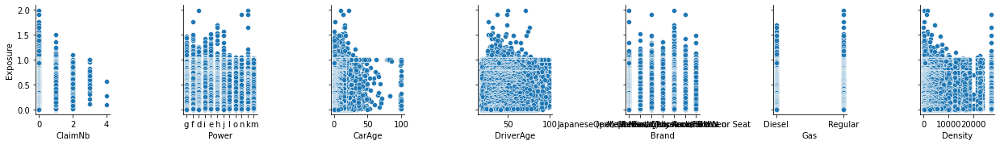

In [ ]:
# Pairplot for Correlation - Exposure versus x variables

pairplot = sns.pairplot(df_merged, x_vars=desc_pairplot_x_vars_A, y_vars='Exposure')

The following observations can be made from the pairplot graphs:

Density: This graph shows a wide distribution of policy exposure periods

Brand: This graph does not show any clear correlation or trend between the exposure period and the insured car brand.

ClaimNumber: The trend shows policyholders with higher claim frequencies tend to be covered on policies with shorter exposure periods 

DriverAge: This graph shows a wide distribution of exposure periods across drivers of different ages, with a range of middle-aged policyholders that are insured with exposure periods longer than 1 year.


Power: The trend shows cars covered by policies with longer exposure periods tend to be less powerful.However, some high-powered cars do not follow this pattern.

Gas: This graph does not show any clear correlation or trend between the exposure period  and the fuel type.

CarAge: The trend shows a high amount of the insured cars  have 1-year exposure periods.

# **Evaluation and Recommendations**

This project is an application of data science in insurance.
A thorough evaluation of areas of improvement for this project gave the following:
1. Each model was trained to the data and tested once. The advantage of retraining and retesting is that it gives an optimal fit to the data.
2. Claims provided in the datasets were used rather than generated claims from own predictions.
3.The average loss amount per claim was not determined and instead the loss amount per policyholder based on each policyholder's features was used.

# **Recommendations**
Stricter feature selection could be used to decrease the number of features fed to the model. A good result of less use  of the number of features is a reduction in overfitting to the training dataset.